#  Task_3_Customer_Segmentation_Using_RFM_Analysis

> Analyze customer behavior using RFM analysis on the dataset "online_retail_II.csv", segment customers based on RFM scores, visualize the segments, and suggest marketing strategies for each segment.

> In this task , we solve deep into the thriving sector of online retail by analyzing a transactional dataset from a UK-based retailer, available at the Kaggle "Online Retail Dataset (UCI)". This dataset collected all transactions between 2009 and 2011. Our primary objective is to amplify the efficiency of marketing strategies and boost sales through customer segmentation. 

## 1. Import Libraries 

In [35]:
# Ignore warnings
import warnings
warnings.filterwarnings('ignore')


# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Set display options for pandas
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


## 2. Load Dataset

In [36]:
df = pd.read_csv('online_retail_II.csv')

In [37]:
df.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom


## 3. Data Exploration / Data Wrangling

In [38]:
print(f"Dataset contains {df.shape[0]} rows and {df.shape[1]} columns.")
print(f"Columns in the dataset: {df.columns.tolist()}")

Dataset contains 1067371 rows and 8 columns.
Columns in the dataset: ['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'Price', 'Customer ID', 'Country']


In [39]:
print(f"Dataset datatypes:\n{df.dtypes}")

Dataset datatypes:
Invoice         object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
Price          float64
Customer ID    float64
Country         object
dtype: object


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067371 entries, 0 to 1067370
Data columns (total 8 columns):
 #   Column       Non-Null Count    Dtype  
---  ------       --------------    -----  
 0   Invoice      1067371 non-null  object 
 1   StockCode    1067371 non-null  object 
 2   Description  1062989 non-null  object 
 3   Quantity     1067371 non-null  int64  
 4   InvoiceDate  1067371 non-null  object 
 5   Price        1067371 non-null  float64
 6   Customer ID  824364 non-null   float64
 7   Country      1067371 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 65.1+ MB


In [41]:
# Statistics Summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,1067371.0,9.938898,172.705794,-80995.00,1.00,3.0,10.00,80995.0
Price,1067371.0,4.649388,123.553059,-53594.36,1.25,2.1,4.15,38970.0
Customer ID,824364.0,15324.638504,1697.464450,12346.00,13975.00,15255.0,16797.00,18287.0


In [42]:
df["InvoiceDate"].nunique() # see the range of dates
df["InvoiceDate"].min(), df["InvoiceDate"].max()  # min and max

('2009-12-01 07:45:00', '2011-12-09 12:50:00')

In [43]:
df["Description"].nunique() # what is the number of unique products?

5698

In [44]:
df["Description"].value_counts() # how many products are there?

Description
WHITE HANGING HEART T-LIGHT HOLDER     5918
REGENCY CAKESTAND 3 TIER               4412
JUMBO BAG RED RETROSPOT                3469
ASSORTED COLOUR BIRD ORNAMENT          2958
PARTY BUNTING                          2765
STRAWBERRY CERAMIC TRINKET BOX         2613
LUNCH BAG  BLACK SKULL.                2529
JUMBO STORAGE BAG SUKI                 2434
HEART OF WICKER SMALL                  2319
JUMBO SHOPPER VINTAGE RED PAISLEY      2297
60 TEATIME FAIRY CAKE CASES            2271
PAPER CHAIN KIT 50'S CHRISTMAS         2215
LUNCH BAG SPACEBOY DESIGN              2206
REX CASH+CARRY JUMBO SHOPPER           2199
HOME BUILDING BLOCK WORD               2192
WOODEN FRAME ANTIQUE WHITE             2189
LUNCH BAG CARS BLUE                    2184
NATURAL SLATE HEART CHALKBOARD         2151
BAKING SET 9 PIECE RETROSPOT           2150
POSTAGE                                2115
WOODEN PICTURE FRAME WHITE FINISH      2115
HEART OF WICKER LARGE                  2112
PACK OF 60 PINK PAIS

In [45]:
df.groupby("Description").agg({"Quantity":"sum"}) # what is the most ordered product?

,Quantity
Description,
DOORMAT UNION JACK GUNS AND ROSES,179
3 STRIPEY MICE FELTCRAFT,690
4 PURPLE FLOCK DINNER CANDLES,351
50'S CHRISTMAS GIFT BAG LARGE,1913
ANIMAL STICKERS,385
BLACK PIRATE TREASURE CHEST,57
BROWN PIRATE TREASURE CHEST,59
Bank Charges,-2
CAMPHOR WOOD PORTOBELLO MUSHROOM,70


In [46]:
df.groupby("Description").agg({"Quantity":"sum"}).sort_values("Quantity", ascending = False) #how do we sort the output above?

,Quantity
Description,
WORLD WAR 2 GLIDERS ASSTD DESIGNS,108545
WHITE HANGING HEART T-LIGHT HOLDER,93050
ASSORTED COLOUR BIRD ORNAMENT,81306
JUMBO BAG RED RETROSPOT,78090
BROCADE RING PURSE,70700
PACK OF 60 PINK PAISLEY CAKE CASES,56575
60 TEATIME FAIRY CAKE CASES,54366
SMALL POPCORN HOLDER,49616
PACK OF 72 RETROSPOT CAKE CASES,49344


In [47]:
df["Invoice"].nunique() #how many invoices have been cut in total?

53628

In [48]:
df["TotalPrice"] = df["Quantity"] * df["Price"]
# how much money has been earned per invoice?
df.groupby("Invoice").agg({"TotalPrice":"sum"})# how do we sort the output above?
df.groupby("Invoice").agg({"TotalPrice":"sum"}).sort_values("TotalPrice", ascending = False) # how do we sort the output above?

,TotalPrice
Invoice,
581483,168469.600
541431,77183.600
574941,52940.940
576365,50653.910
533027,49844.990
531516,45332.970
493819,44051.600
556444,38970.000
524181,33167.800


In [49]:
df.groupby("Invoice").agg({"TotalPrice":"sum"}).sort_values("TotalPrice", ascending = False) #calculated the total amount of money earned per invoice.

,TotalPrice
Invoice,
581483,168469.600
541431,77183.600
574941,52940.940
576365,50653.910
533027,49844.990
531516,45332.970
493819,44051.600
556444,38970.000
524181,33167.800


In [50]:
df.groupby("Description").agg({"Price":"max"}).sort_values("Price", ascending = False).head() # what are the most expensive products?

,Price
Description,
Manual,38970.00
Bank Charges,18910.69
AMAZON FEE,17836.46
Adjust bad debt,11062.06
POSTAGE,8142.75


In [51]:
df.sort_values("Price", ascending = False).head() # what are the most expensive products?

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,TotalPrice
748142,C556445,M,Manual,-1,2011-06-10 15:31:00,38970.00,15098.0,United Kingdom,-38970.00
241824,C512770,M,Manual,-1,2010-06-17 16:52:00,25111.09,17399.0,United Kingdom,-25111.09
241827,512771,M,Manual,1,2010-06-17 16:53:00,25111.09,NaN,United Kingdom,25111.09
320581,C520667,BANK CHARGES,Bank Charges,-1,2010-08-27 13:42:00,18910.69,NaN,United Kingdom,-18910.69
1050063,C580605,AMAZONFEE,AMAZON FEE,-1,2011-12-05 11:36:00,17836.46,NaN,United Kingdom,-17836.46


In [52]:
df["Country"].value_counts().head() #how many orders came from what country?

Country
United Kingdom    981330
EIRE               17866
Germany            17624
France             14330
Netherlands         5140
Name: count, dtype: int64

In [53]:
df["Customer ID"].unique()

array([13085., 13078., 15362., ..., 15520., 13298., 12713.])

> Data Cleaning ___

In [54]:
# Check for missing values
print(f"Missing values in each column:\n{df.isnull().sum()}")

# Check for missing values in dataset
print(f"Dataset contains {df.isnull().sum().sum()} missing values.")


Missing values in each column:
Invoice             0
StockCode           0
Description      4382
Quantity            0
InvoiceDate         0
Price               0
Customer ID    243007
Country             0
TotalPrice          0
dtype: int64
Dataset contains 247389 missing values.


In [55]:
# Check missing values in percentage
missing_percentage = df.isnull().mean() * 100
print(f"Missing values in percentage:\n{missing_percentage}")

Missing values in percentage:
Invoice         0.000000
StockCode       0.000000
Description     0.410541
Quantity        0.000000
InvoiceDate     0.000000
Price           0.000000
Customer ID    22.766873
Country         0.000000
TotalPrice      0.000000
dtype: float64


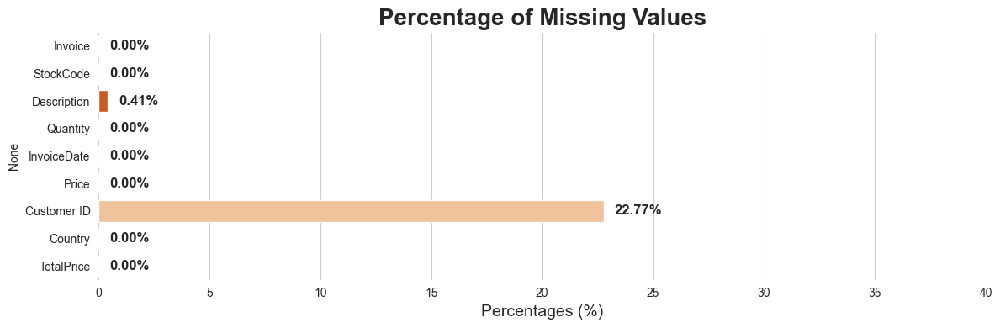

In [56]:
# Visualize missing values as a bar plot
sns.set_style("whitegrid")
plt.figure(figsize=(12, 4))

ax = sns.barplot(
    x=missing_percentage.values, 
    y=missing_percentage.index, 
    palette="Oranges_r"
)

# Annotate values
for i, v in enumerate(missing_percentage.values):
    ax.text(v + 0.5, i, f"{v:.2f}%", va='center', fontsize=12, fontweight='bold')

plt.title("Percentage of Missing Values", fontsize=20, fontweight='bold')
plt.xlabel("Percentages (%)", fontsize=14)
plt.xlim(0, 40)

sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()


> Remove missing values from Description and Customer ID
> 

In [57]:
# Remove missing values from Description and Customer ID
df = df.dropna(subset=['Description', 'Customer ID'])

# Lets check missing values again
print(f"Missing values in each column after cleaning:\n{df.isnull().sum()}")

Missing values in each column after cleaning:
Invoice        0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
Price          0
Customer ID    0
Country        0
TotalPrice     0
dtype: int64


> Now Remove Duplicates

In [58]:
# Check for duplicate rows in dataset
print(f"Dataset contains {df.duplicated().sum()} duplicate rows.") 

Dataset contains 26479 duplicate rows.


In [59]:
# Remove duplicate rows from dataset
df = df.drop_duplicates()

In [60]:
# Lets check for duplicates again
print(f"Dataset contains {df.duplicated().sum()} duplicate rows after cleaning.")

Dataset contains 0 duplicate rows after cleaning.


In [61]:
# Now Check the remaining rows in the dataset after cleaning
print(f"Dataset contains {df.shape[0]} rows and {df.shape[1]} columns after cleaning.")

Dataset contains 797885 rows and 9 columns after cleaning.


> Outliers Treatment

In [62]:
# Resetting the index of the cleaned dataset
df.reset_index(drop=True, inplace=True)

In [63]:
# Getting the number of rows in the dataframe
print(f"Number of rows in the cleaned dataset: {df.shape[0]}")

Number of rows in the cleaned dataset: 797885


In [64]:
# Check for unique values in each column
for column in df.columns:
    unique_values = df[column].nunique()
    print(f"Column '{column}' has {unique_values} unique values.")

Column 'Invoice' has 44876 unique values.
Column 'StockCode' has 4646 unique values.
Column 'Description' has 5299 unique values.
Column 'Quantity' has 643 unique values.
Column 'InvoiceDate' has 41439 unique values.
Column 'Price' has 1022 unique values.
Column 'Customer ID' has 5942 unique values.
Column 'Country' has 41 unique values.
Column 'TotalPrice' has 5625 unique values.


## 4. Feature Engineering

> RFM is a method used for analyzing customer value and segmenting the customer base. It is an acronym that stands for:

> Recency (R): This metric indicates how recently a customer has made a purchase. A lower recency value means the customer has purchased more recently, indicating higher engagement with the brand.    
> 
> Frequency (F): This metric signifies how often a customer makes a purchase within a certain period. A higher frequency value indicates a customer who interacts with the business more often, suggesting higher loyalty or satisfaction.
> 
> Monetary (M): This metric represents the total amount of money a customer has spent over a certain period. Customers who have a higher monetary value have contributed more to the business, indicating their potential high lifetime value.

> Together, these metrics help in understanding a customer's buying behavior and preferences, which is pivotal in personalizing marketing strategies and creating a recommendation system.

> Calculate Recency , Frequency , Monetery for each customer

In [65]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
most_recent_date = df['InvoiceDate'].max()

rfm_df = df.groupby('Customer ID').agg(
    Recency=('InvoiceDate', lambda date: (most_recent_date - date.max()).days),
    Frequency=('Invoice', 'nunique'),
    Monetary=('Price', lambda price: (df.loc[price.index, 'Quantity'] * price).sum())
)

display(rfm_df.head())

,Recency,Frequency,Monetary
Customer ID,,,
12346.0,325,17,-51.74
12347.0,1,8,4921.53
12348.0,74,5,2019.40
12349.0,18,5,4404.54
12350.0,309,1,334.40


> Rfm scoring : Assign scores (e.g., 1 to 5) to each customer based on their Recency, Frequency, and Monetary values.

> Assign R, F, and M scores based on quantiles of the respective columns in the rfm_df DataFrame and display the head of the updated DataFrame.

In [66]:
rfm_df['R_score'] = pd.qcut(rfm_df['Recency'], 5, labels=[5, 4, 3, 2, 1])

# Determine the number of unique quantiles for Frequency after dropping duplicates
freq_quantiles = pd.qcut(rfm_df['Frequency'], 5, duplicates='drop').unique()
num_freq_quantiles = len(freq_quantiles)
freq_labels = [i for i in range(1, num_freq_quantiles + 1)]
rfm_df['F_score'] = pd.qcut(rfm_df['Frequency'], num_freq_quantiles, labels=freq_labels, duplicates='drop')


# Determine the number of unique quantiles for Monetary after dropping duplicates
monetary_quantiles = pd.qcut(rfm_df['Monetary'], 5, duplicates='drop').unique()
num_monetary_quantiles = len(monetary_quantiles)
monetary_labels = [i for i in range(1, num_monetary_quantiles + 1)]
rfm_df['M_score'] = pd.qcut(rfm_df['Monetary'], num_monetary_quantiles, labels=monetary_labels, duplicates='drop')

display(rfm_df.head())

,Recency,Frequency,Monetary,R_score,F_score,M_score
Customer ID,,,,,,
12346.0,325,17,-51.74,2,4,1
12347.0,1,8,4921.53,5,3,5
12348.0,74,5,2019.40,3,3,4
12349.0,18,5,4404.54,4,3,5
12350.0,309,1,334.40,2,1,2


> Create RFM segments based on the combined RFM scores.

In [67]:
rfm_df['RFM_score'] = rfm_df['R_score'].astype(str) + rfm_df['F_score'].astype(str) + rfm_df['M_score'].astype(str)

# Define RFM segments
def rfm_segment(score):
    if score in ['555', '554', '544', '545', '454', '455', '445']:
        return 'Champions'
    elif score in ['543', '444', '434', '344', '345', '354', '355', '244', '245', '254', '255', '144', '145', '154', '155']:
        return 'Loyal Customers'
    elif score in ['535', '534', '435', '434', '335', '334', '343', '235', '234', '243', '135', '134', '143']:
        return 'Potential Loyalists'
    elif score in ['525', '524', '523', '522', '521', '515', '514', '513', '512', '511', '425', '424', '423', '422', '421', '415', '414', '413', '412', '411', '325', '324', '323', '322', '321', '315', '314', '313', '312', '311', '225', '224', '223', '222', '221', '215', '214', '213', '212', '211', '125', '124', '123', '122', '121', '115', '114', '113', '112', '111']:
        return 'At Risk Customers'
    elif score in ['511', '411', '311', '211', '111']:
        return 'Lost Customers'
    elif score in ['551', '552', '553', '541', '542', '531', '532', '533', '521', '522', '451', '452', '453', '441', '442', '443', '431', '432', '433', '421', '422', '423', '351', '352', '353', '341', '342', '343', '331', '332', '333', '321', '322', '323', '251', '252', '253', '241', '242', '243', '231', '232', '233', '221', '222', '223', '151', '152', '153', '141', '142', '143', '131', '132', '133', '121', '122', '123', '111', '112', '113', '114', '115']:
        return 'Hibernating Customers'
    else:
        return 'Other'


rfm_df['RFM_Segment'] = rfm_df['RFM_score'].apply(rfm_segment)

display(rfm_df.head())

,Recency,Frequency,Monetary,R_score,F_score,M_score,RFM_score,RFM_Segment
Customer ID,,,,,,,,
12346.0,325,17,-51.74,2,4,1,241,Hibernating Customers
12347.0,1,8,4921.53,5,3,5,535,Potential Loyalists
12348.0,74,5,2019.40,3,3,4,334,Potential Loyalists
12349.0,18,5,4404.54,4,3,5,435,Potential Loyalists
12350.0,309,1,334.40,2,1,2,212,At Risk Customers


## 5. Visualize rfm segments

 > Visualize the RFM segments using appropriate charts (bar charts).

In [69]:
import plotly.express as px

segment_counts = rfm_df['RFM_Segment'].value_counts().reset_index()
segment_counts.columns = ['RFM_Segment', 'Customer Count']

fig = px.bar(segment_counts, x='RFM_Segment', y='Customer Count',
             title='Distribution of Customers Across RFM Segments',
             labels={'RFM_Segment': 'RFM Segment', 'Customer Count': 'Number of Customers'},
             color='RFM_Segment') # Assign color based on segment for better visualization
fig.show()

In [81]:
rfm_df['RFM_score'] = rfm_df['R_score'].astype(str) + rfm_df['F_score'].astype(str) + rfm_df['M_score'].astype(str)
rfm_df['RFM_score']

Customer ID
12346.0    241
12347.0    535
12348.0    334
12349.0    435
12350.0    212
12351.0    212
12352.0    444
12353.0    212
12354.0    213
12355.0    213
12356.0    435
12357.0    425
12358.0    535
12359.0    545
12360.0    445
12361.0    222
12362.0    545
12363.0    312
12364.0    524
12365.0    222
12366.0    112
12367.0    511
12368.0    113
12369.0    224
12370.0    435
12371.0    435
12372.0    324
12373.0    223
12374.0    425
12375.0    522
12376.0    212
12377.0    225
12378.0    315
12379.0    334
12380.0    445
12381.0    534
12382.0    111
12383.0    334
12384.0    422
12385.0    214
12386.0    212
12387.0    111
12388.0    535
12389.0    224
12390.0    312
12391.0    434
12392.0    111
12393.0    334
12394.0    314
12395.0    545
12396.0    113
12397.0    414
12398.0    414
12399.0    334
12400.0    211
12401.0    211
12402.0    234
12403.0    423
12404.0    111
12405.0    314
12406.0    435
12407.0    434
12408.0    445
12409.0    345
12410.0    223
12411.0    21

In [82]:
# Conclusion of all the above tasks and visualization
print("The RFM analysis has been successfully completed. The RFM scores and segments have been calculated, and the results have been visualized.")
# The RFM segments provide insights into customer behavior, allowing for targeted marketing strategies and improved customer retention.
# The analysis can be used to identify high-value customers, understand customer loyalty, and tailor marketing
# strategies accordingly.
# The visualization helps in understanding the distribution of customers across different segments, enabling better decision-making.    


The RFM analysis has been successfully completed. The RFM scores and segments have been calculated, and the results have been visualized.


> Suggest simple marketing strategies for each RFM segment.

In [83]:
marketing_strategies = {
    'Champions': "Reward them with exclusive access to new products or special discounts. Encourage referrals.",
    'Loyal Customers': "Offer loyalty programs, personalized recommendations, and early access to sales.",
    'Potential Loyalists': "Engage them with targeted content, special offers on their preferred categories, and encourage repeat purchases.",
    'At Risk Customers': "Launch re-engagement campaigns with win-back offers, personalized emails, or surveys to understand their reasons for decreased activity.",
    'Hibernating Customers': "Attempt to re-activate them with significant discounts or special promotions. Consider a 'we miss you' campaign.",
    'Lost Customers': "Analyze their past behavior to understand why they left and consider highly targeted, high-incentive offers for a potential return, or focus resources elsewhere."
}

for segment, strategy in marketing_strategies.items():
    print(f"**{segment}:** {strategy}\n")

**Champions:** Reward them with exclusive access to new products or special discounts. Encourage referrals.

**Loyal Customers:** Offer loyalty programs, personalized recommendations, and early access to sales.

**Potential Loyalists:** Engage them with targeted content, special offers on their preferred categories, and encourage repeat purchases.

**At Risk Customers:** Launch re-engagement campaigns with win-back offers, personalized emails, or surveys to understand their reasons for decreased activity.

**Hibernating Customers:** Attempt to re-activate them with significant discounts or special promotions. Consider a 'we miss you' campaign.

**Lost Customers:** Analyze their past behavior to understand why they left and consider highly targeted, high-incentive offers for a potential return, or focus resources elsewhere.

